In [3]:
# import the necessary libraries
import numpy as np
import pandas as pd

# Visualisation libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
## import chart_studio.plotly as py
## from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

import warnings
warnings.filterwarnings('ignore')

In [44]:
# Loading the data as df
df=pd.read_csv('city_day.csv')
#Converting String to Datetime
df['Date'] = pd.to_datetime(df['Date'])
print(np.dtype(df['Date']))
df.rename(columns = {'AQI_Bucket':'Air_quality'}, inplace = True)
df.head()

datetime64[ns]


,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


## Data Understanding

In [5]:
df.shape

(29531, 16)

In [6]:
df.columns

Index(['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'Air_quality'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   City         29531 non-null  object        
 1   Date         29531 non-null  datetime64[ns]
 2   PM2.5        24933 non-null  float64       
 3   PM10         18391 non-null  float64       
 4   NO           25949 non-null  float64       
 5   NO2          25946 non-null  float64       
 6   NOx          25346 non-null  float64       
 7   NH3          19203 non-null  float64       
 8   CO           27472 non-null  float64       
 9   SO2          25677 non-null  float64       
 10  O3           25509 non-null  float64       
 11  Benzene      23908 non-null  float64       
 12  Toluene      21490 non-null  float64       
 13  Xylene       11422 non-null  float64       
 14  AQI          24850 non-null  float64       
 15  Air_quality  24850 non-null  object        
dtypes: d

In [8]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [9]:
# Data availability
print(f"The available data we have is between {df['Date'].min()} and {df['Date'].max()}")

The available data we have is between 2015-01-01 00:00:00 and 2020-07-01 00:00:00


In [10]:
# How many rows available for each City.
df['City'].value_counts()

Ahmedabad             2009
Delhi                 2009
Mumbai                2009
Bengaluru             2009
Lucknow               2009
Chennai               2009
Hyderabad             2006
Patna                 1858
Gurugram              1679
Visakhapatnam         1462
Amritsar              1221
Jorapokhar            1169
Jaipur                1114
Thiruvananthapuram    1112
Amaravati              951
Brajrajnagar           938
Talcher                925
Kolkata                814
Guwahati               502
Coimbatore             386
Shillong               310
Chandigarh             304
Bhopal                 289
Ernakulam              162
Kochi                  162
Aizawl                 113
Name: City, dtype: int64

In [11]:
df[df['Air_quality']=='Severe']['City'].value_counts() 
#Here Ahmedabad,Delhi,Patna seems to be highest in case and Ahemdabad to be very much higher than others.

Ahmedabad     638
Delhi         239
Patna         174
Lucknow       110
Gurugram       95
Talcher        24
Jorapokhar     18
Kolkata        13
Amritsar        7
Hyderabad       7
Chennai         6
Guwahati        5
Jaipur          2
Name: City, dtype: int64

In [45]:
pd.to_datetime(df[(df['Air_quality']=='Severe')&(df['City']=='Ahmedabad')]['Date']).dt.year.value_counts()

2018    277
2019    224
2015     51
2017     37
2020     29
2016     20
Name: Date, dtype: int64

* **As we see here,in the city of Ahmedabad year 2018,2019 severe instances has been found and the condition of air quality was harmful.**

# Exploratory Data Analysis

## Missing value Treatment

In [47]:
def missing_value_table(df):
    values = df.isnull().sum()
    percentage = 100*df.isnull().sum()/len(df)
    table = pd.concat([values,percentage.round(2)],axis=1)
    table.columns = ['No of missing values','% of missing values']
    return table[table['No of missing values']!=0].sort_values('% of missing values',ascending=False).style.background_gradient('Reds')
missing_value_table(df)    

,No of missing values,% of missing values
Xylene,18109,61.320000
PM10,11140,37.720000
NH3,10328,34.970000
Toluene,8041,27.230000
Benzene,5623,19.040000
AQI,4681,15.850000
Air_quality,4681,15.850000
PM2.5,4598,15.570000
NOx,4185,14.170000
O3,4022,13.620000


<AxesSubplot:>

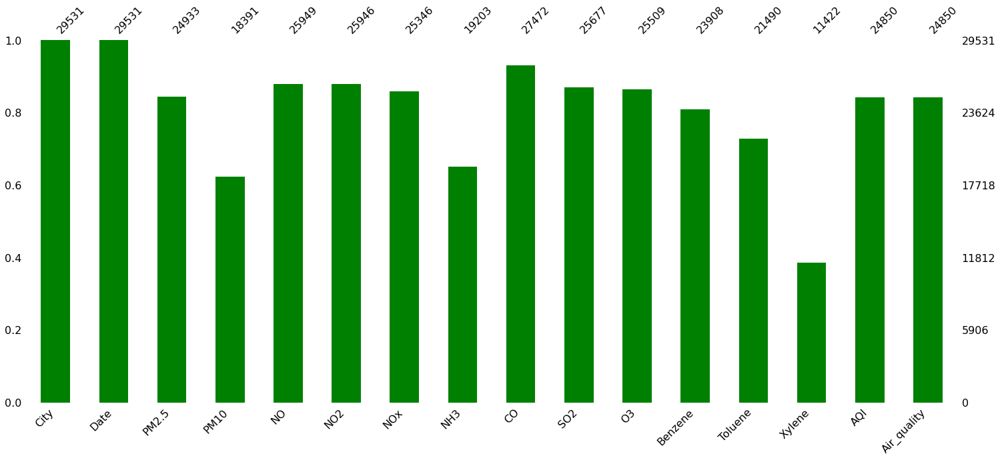

In [16]:
#import the missingno plot and checking missing values.
import missingno 
missingno.bar(df, color="green")

* In this bar chart of missing values, we can see that **Xylene, PM10** and **NH3** is mostly have the missing values.
* **we can also see that we don't have any missing values in the City and Date column.**
* **We can see that there is a relation between AQI and AQI_Bucket. when the AQI is missing, AQI_Bucket is also missing.**

In [49]:
# Treating missing values in the copy of df
df1=df.copy()
df1_columns=['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI']
for i in df1_columns:
    df1[i]=df1[i].fillna(df1[i].median())
df1['Air_quality']=df1['Air_quality'].fillna('moderate')

In [19]:
df1.isna().sum()

City           0
Date           0
PM2.5          0
PM10           0
NO             0
NO2            0
NOx            0
NH3            0
CO             0
SO2            0
O3             0
Benzene        0
Toluene        0
Xylene         0
AQI            0
Air_quality    0
dtype: int64

## Distribusion of AQI 

Severe          1338
Good            1341
Very Poor       2337
Poor            2781
moderate        4681
Satisfactory    8224
Moderate        8829
Name: Air_quality, dtype: int64


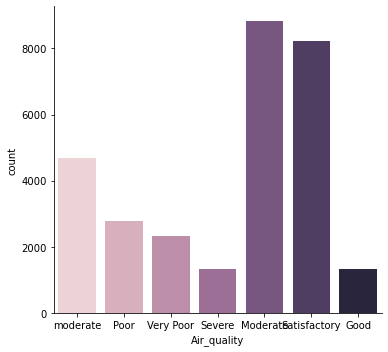

In [38]:
# Plotting distribusion of Air quality
print(df1['Air_quality'].value_counts(ascending= True))
sns.catplot(x = 'Air_quality', kind= "count", palette = "ch: 2.87", height=5, aspect=1.1, data = df1)

**Mainly there are six categories of AQI which we observe: Good, Satisfactory, Moderate, Poor, Very Poor and Severe.**

## Correlation Analysis

Text(0.5, 1.0, 'Correlation Analysis')

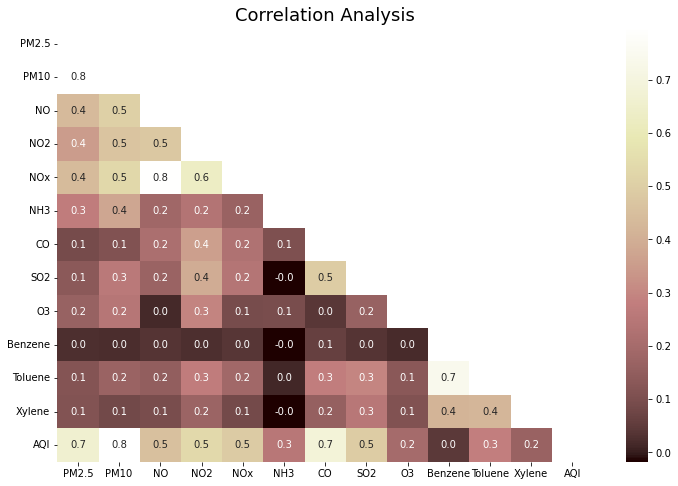

In [21]:
#Analyze the Correlation between Columns.
#correlation analysis

plt.figure(figsize=(12,8))

mask=np.triu(df.corr(method='pearson'))
sns.heatmap(df.corr(method='pearson'),
            annot=True,fmt='0.1f',
            mask=mask,
            robust=True,
            cmap='pink')
plt.title('Correlation Analysis', fontsize=18)

* **From the above heatmap, we observe a strong correlation of NO WITH NOX, NO2 WITH NOX AND BENZENE WITH TOLUENE.**

Text(0.5, 1.0, 'Correlation of NO with NOx')

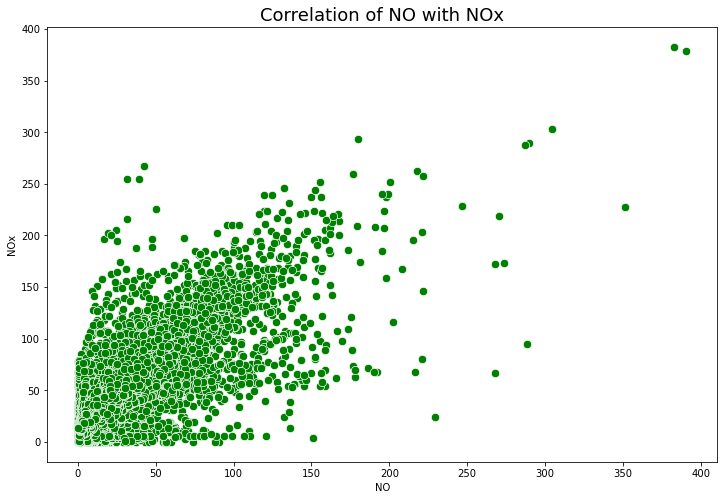

In [22]:
#Let's first visualize their correlation.
# Checking relationship between NO and NOx
plt.figure(figsize=(12,8))
sns.scatterplot(x='NO',y='NOx',data=df,s=70,color='green')
plt.title('Correlation of NO with NOx', fontsize=18)

Text(0.5, 1.0, 'Correlation of NO2 with NOx')

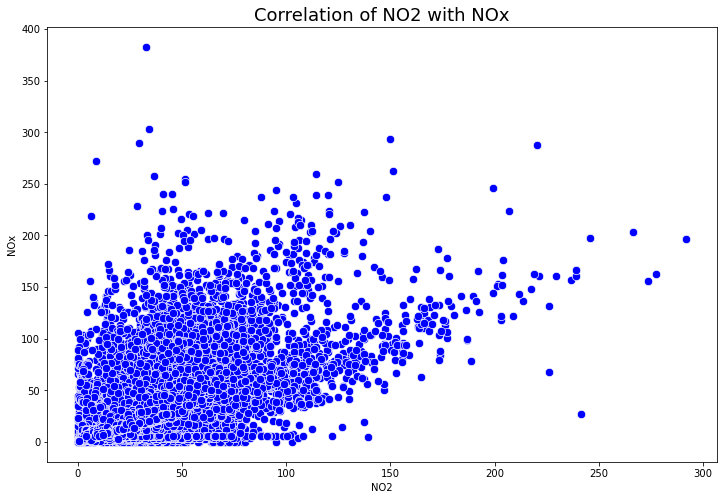

In [23]:
# Checking relationship between NO2 and NOx.
plt.figure(figsize=(12,8))
sns.scatterplot(x='NO2',y='NOx',data=df,s=70,color='Blue')
plt.title("Correlation of NO2 with NOx", fontsize=18)

* **In the First two scatter plots, we observe that there is a correlation between NO, NO2 and NOx and it's obvious because all these three elements are the member of seven gases and compounds group composed of Nitrogen and Oxygen.**

Text(0.5, 1.0, 'Correlation of Benzene with Toluene')

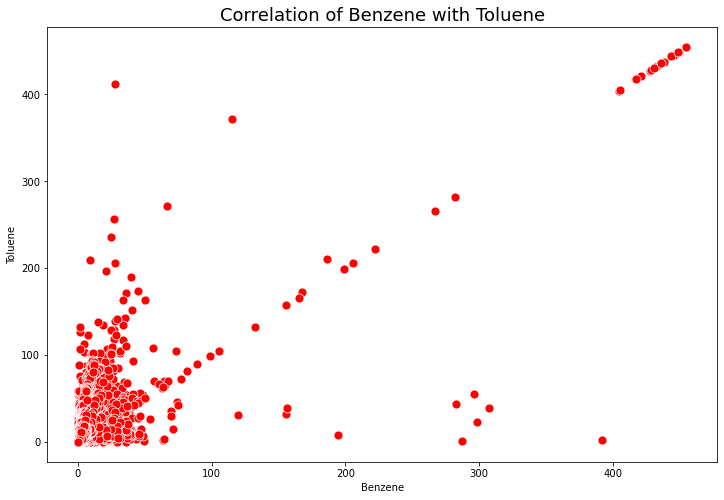

In [24]:
# Checking relationship between Benzene and Toluene.
plt.figure(figsize=(12,8))
sns.scatterplot(x='Benzene',y='Toluene',data=df,s=80,color='Red')
plt.title("Correlation of Benzene with Toluene", fontsize=18)

* **In this plot we observe a correlation between Benzene and Toluene and this time, its again obvious because Benzene, Toluene and Xylene are well known indoor air pollutants. sometimes its called as BTX.**

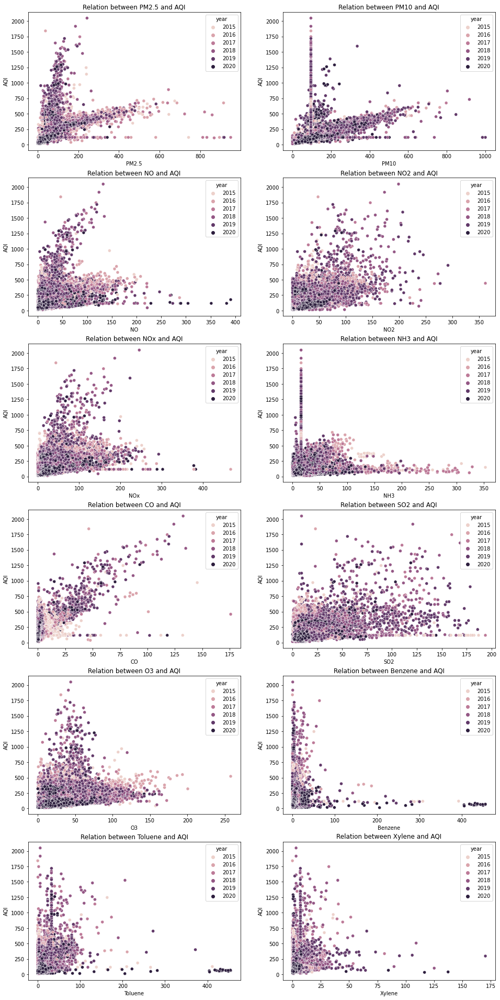

In [52]:
# Checking the relation between each pollution content and AQI
df2=df1.copy()
variables = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','Benzene','Toluene','Xylene']
df2['year'] = df2['Date'].dt.year
fig = plt.figure(figsize=(16,34))
for variable,num in zip(variables, range(1,len(variables)+1)):
    ax = fig.add_subplot(6,2,num)
    sns.scatterplot(variable,'AQI', hue='year', data=df2)
    plt.title('Relation between {} and AQI'.format(variable))
    plt.xlabel(variable)
    plt.ylabel('AQI')

* **PM2.5 -> This shows a inversely proportional behaviour since when it's value remains low the AQI value increases while in other cases when its value increases the AQI value reamins low.**
* **PM10 -> This also shows an inverse behaviour except for the fact that even when PM10 value is less AQI value doesn't increase much.**

## The pollution levels with repect to time

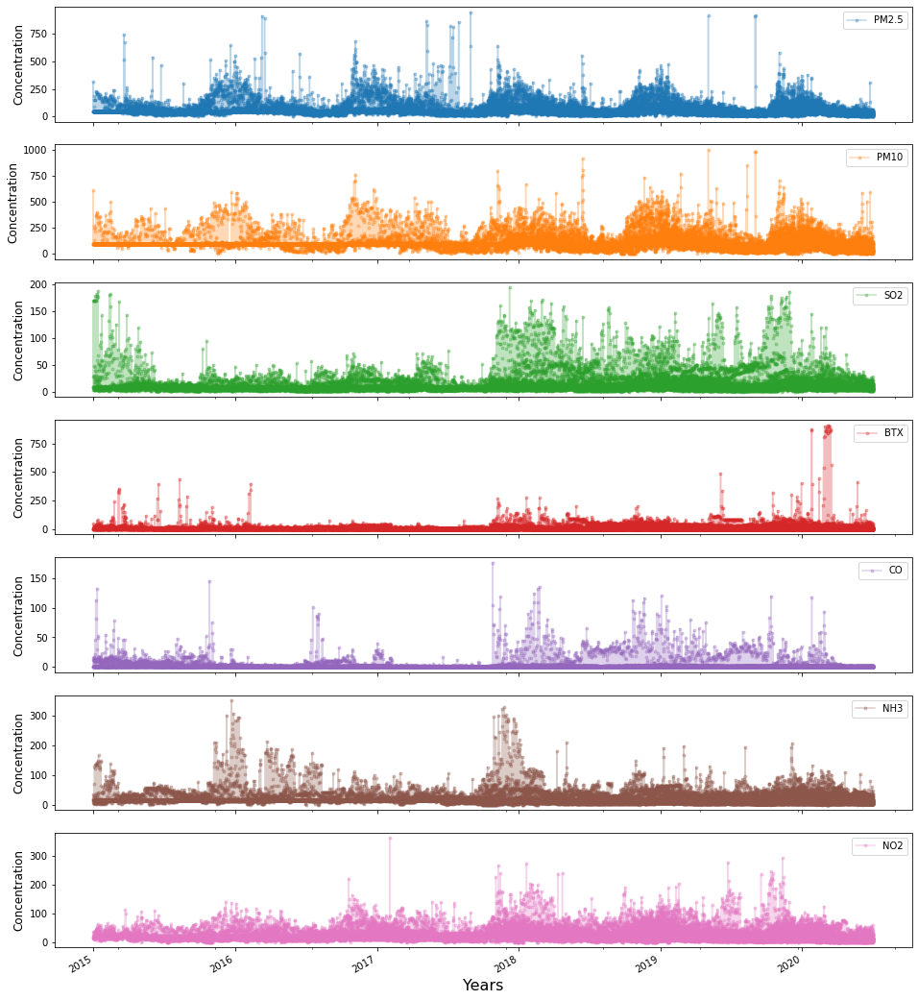

In [54]:
#The pollution levels with repect to time
df2=df1.copy()
df2.set_index('Date',inplace=True) 
df2['BTX'] = df2['Xylene'] + df2['Toluene'] + df2['Benzene']
pollutants=['PM2.5','PM10','SO2','BTX','CO','NH3','NO2']

axes=df2[pollutants].plot(marker='.',figsize=(16,20),subplots=True,alpha=0.3)
for axes in axes:
    axes.set_xlabel('Years',fontsize=16)
    axes.set_ylabel('Concentration',fontsize=12)
plt.show()

* **There are indications of seasonality towards the increase in PM2.5 and PM10 levels.**
* **We should take a closer look to determine the exact nature of the trend.**
* **We can also observe a clear increase in SO2, CO and BTX levels from 2018 onwards.**

In [56]:
df2=df1.copy()
df2['year'] = df2['Date'].dt.year
df2['year'] = df2['year'].astype(str)
temp = df2.groupby(['year'])[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 
                                                  'NH3', 'CO', 'SO2','O3', 'Benzene', 
                                                  'Toluene', 'Xylene', 'AQI']].median()
temp.style.background_gradient(cmap="Reds")

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
year,,,,,,,,,,,,,
2015,48.570000,95.680000,9.890000,21.290000,22.270000,15.850000,1.580000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
2016,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.960000,8.705000,30.840000,1.070000,2.970000,0.980000,118.000000
2017,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.650000,9.160000,30.840000,1.070000,2.750000,0.980000,118.000000
2018,48.570000,95.680000,10.210000,24.540000,26.540000,15.850000,0.900000,9.210000,30.840000,1.070000,2.970000,0.980000,118.000000
2019,45.970000,95.680000,10.055000,21.640000,24.960000,15.850000,0.890000,9.960000,30.405000,1.070000,2.970000,0.980000,113.000000
2020,35.415000,79.665000,8.520000,16.230000,19.860000,15.485000,0.760000,9.160000,31.415000,1.070000,2.970000,0.980000,96.000000


* **We can see in 2020, there has been a decrease in air pollution.And we all know it may be because of effects of covid19 and lockdown.This is the world's largest lockdown.**

## Average AQI over the Years

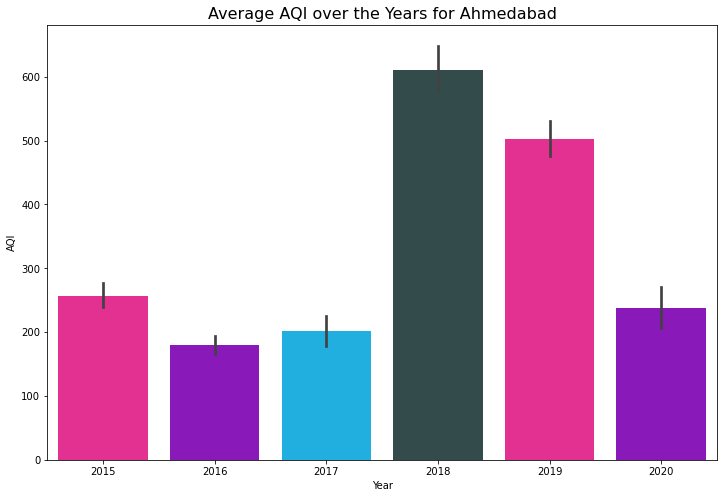

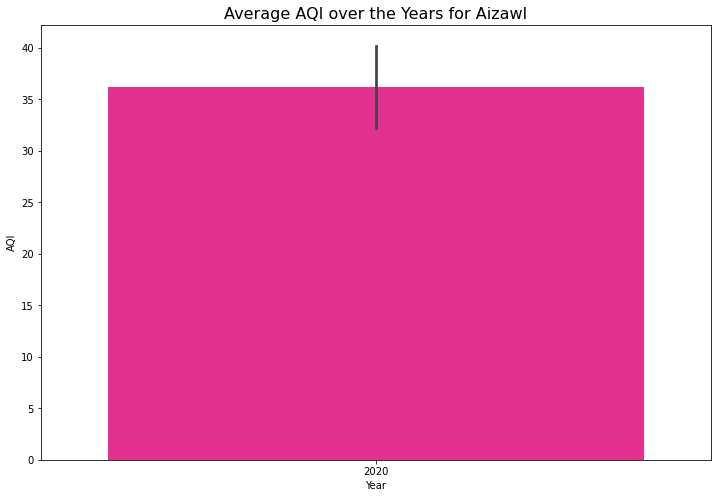

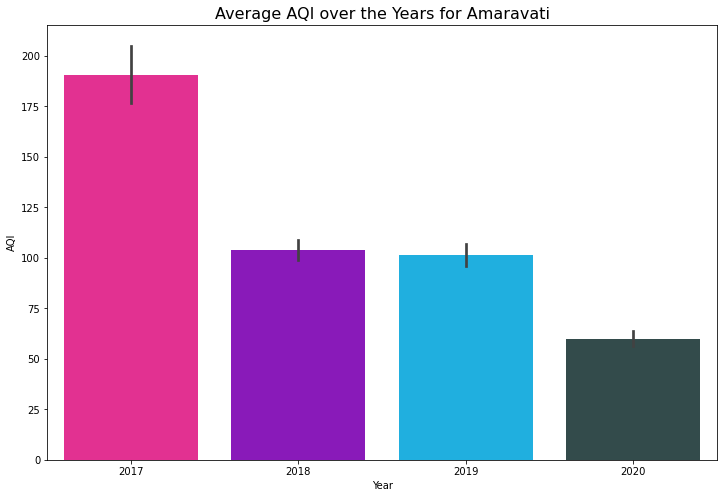

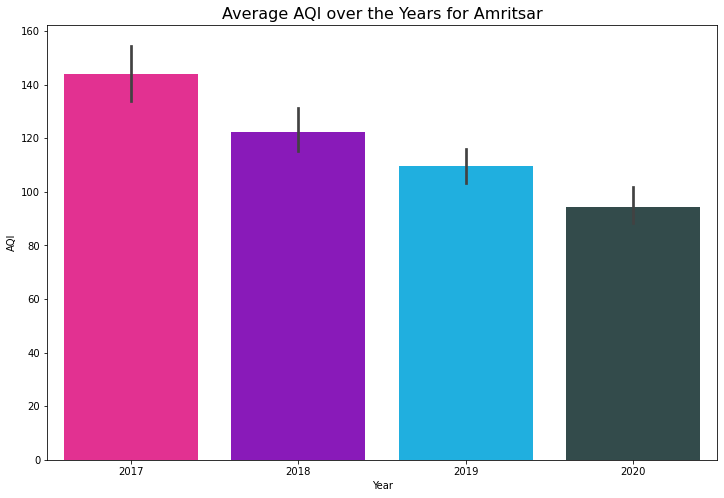

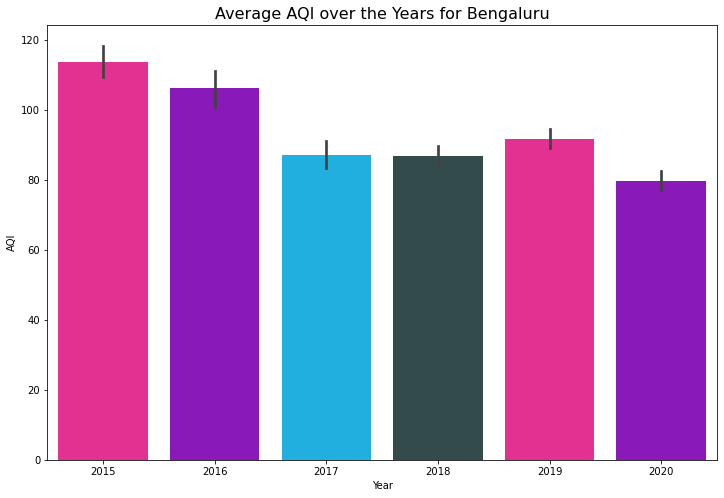

...

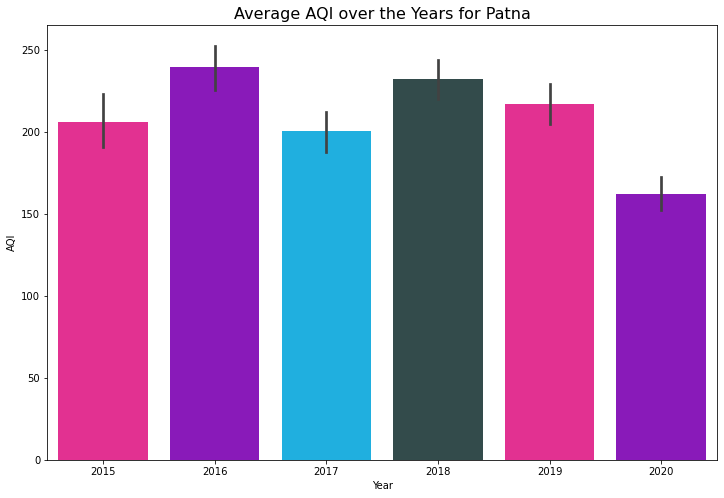

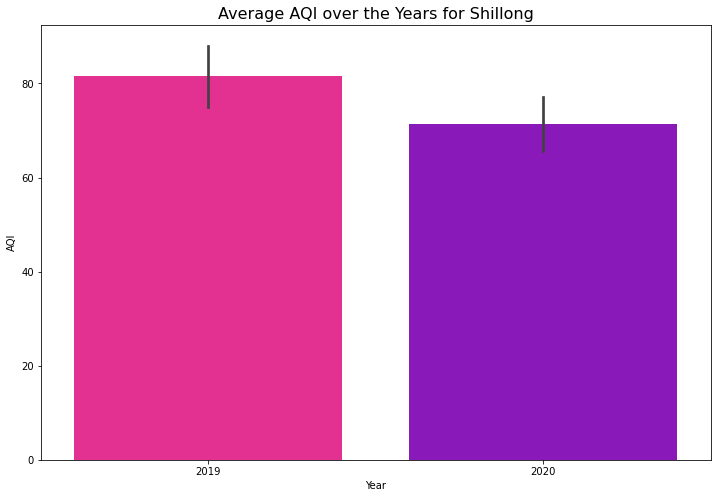

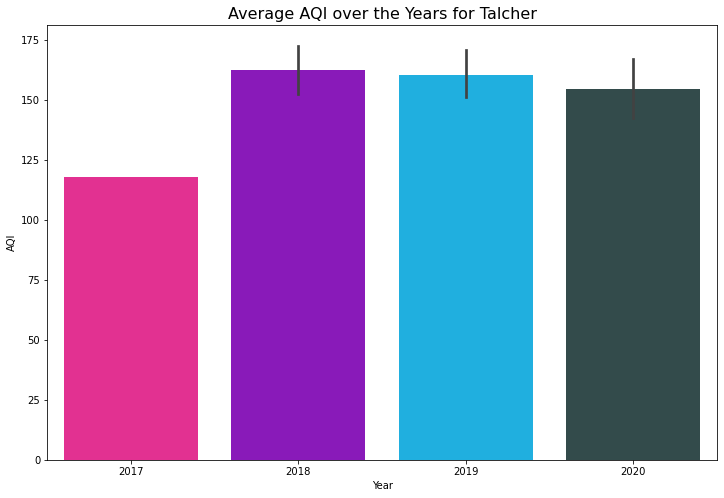

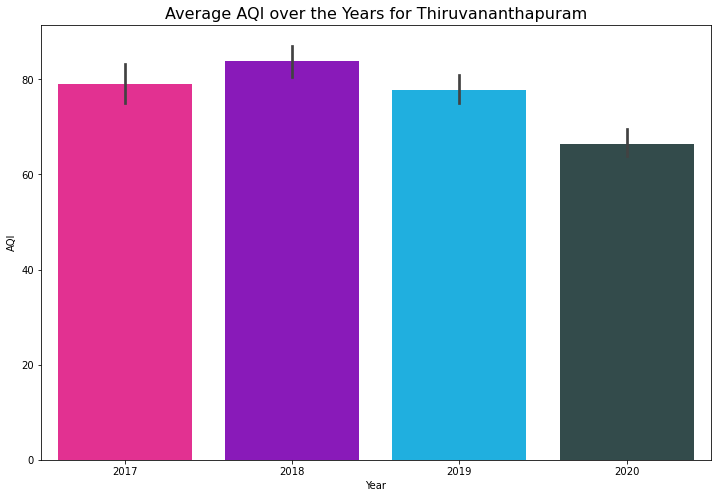

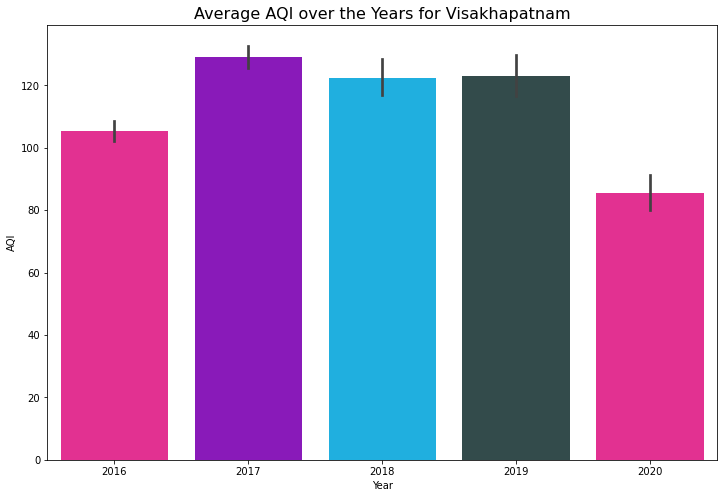

In [57]:
# Average AQI over the Years for different Cities.
df2=df1.copy()
color1 = 'deeppink', 'darkviolet',  'deepskyblue', 'darkslategrey'
df2['City'][df2['AQI']>=500].value_counts()
cols = df2['City'].unique()
df2['Year'] = df2.Date.dt.year.astype(int)
for col in cols:
    plt.figure(figsize=(12,8))
    x= df2[df2['City']==col]
    sns.barplot(x='Year', y='AQI', data=x, palette =color1)
    plt.title(f"Average AQI over the Years for {col}", fontsize=16)
    display()

**After analyzing the Average AQI level for different cities over Years, we found that most of the cities are performing good to tackle the problem of Air Pollution. Their Average AQI level is shrinking Year by Year**

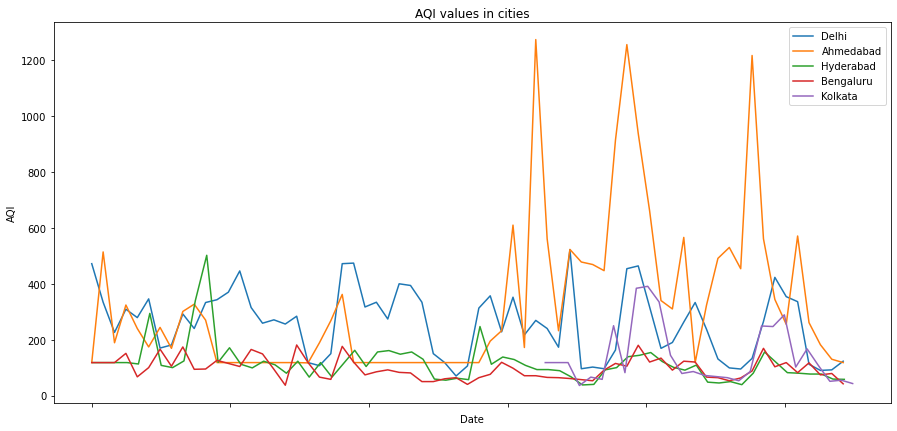

In [58]:
cities = ['Delhi', 'Ahmedabad', 'Hyderabad', 'Bengaluru', 'Kolkata']
fig,ax = plt.subplots(figsize=(15, 7))

for city in cities: 
    sns.lineplot(x="Date", y="AQI", data=df1[df1['City']==city].iloc[::30],label = city)

ax.set_xticklabels(ax.get_xticklabels(cities), rotation=30, ha="left")

ax.set_title('AQI values in cities')
ax.legend()

* **As expected we can see maximum amounts of pollutants in metropolitan cities with large populations and significant 
  commercial and maunfacturing activities.**

## Impact of particular matter on city air quality

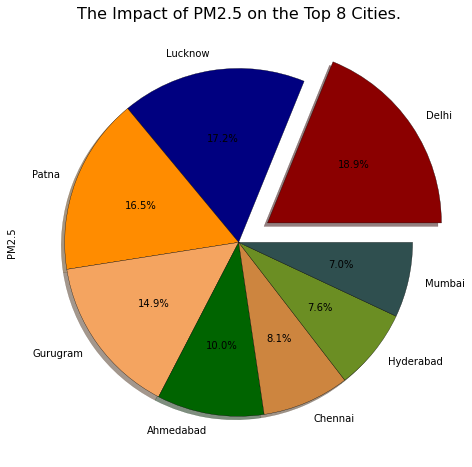

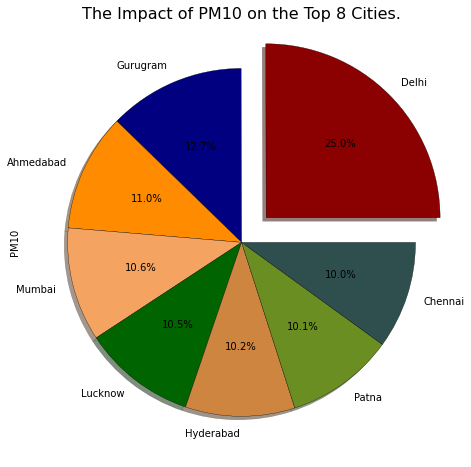

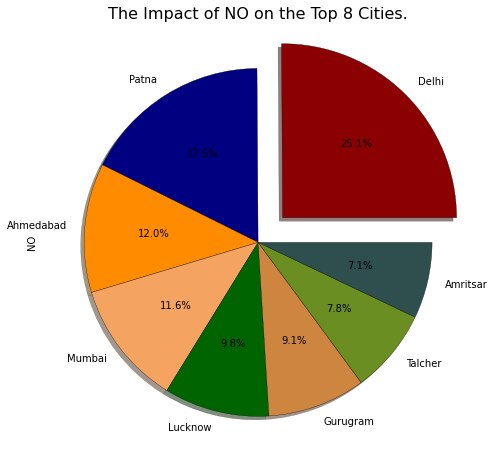

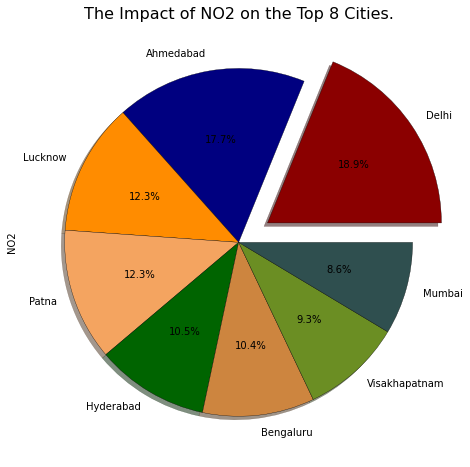

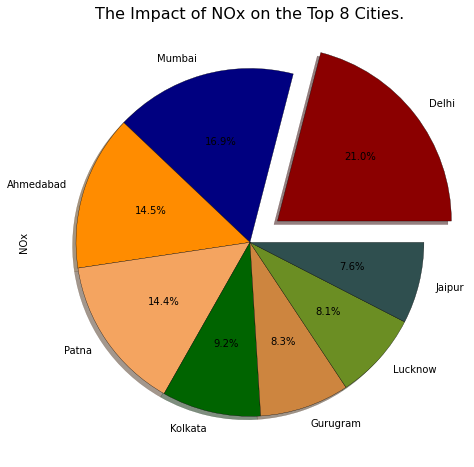

...

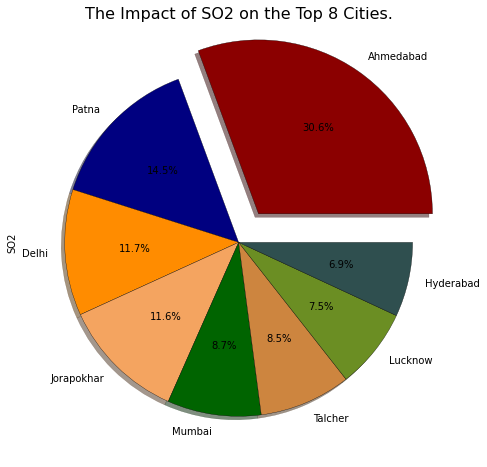

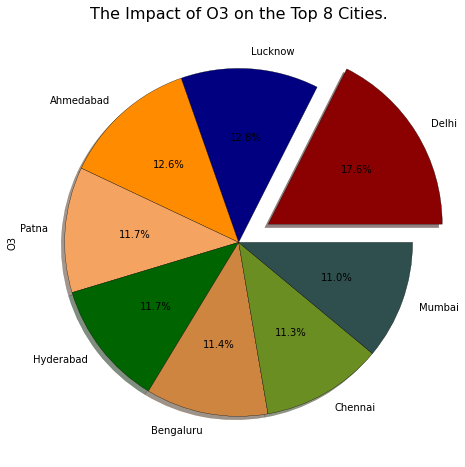

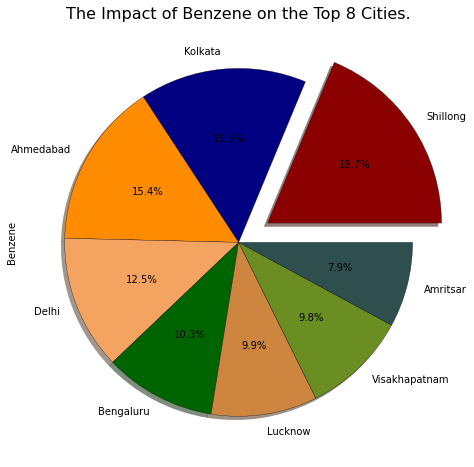

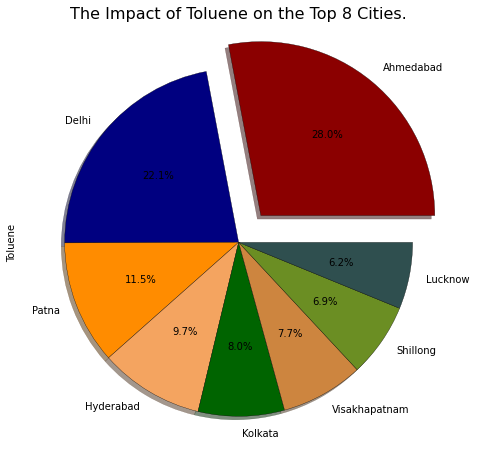

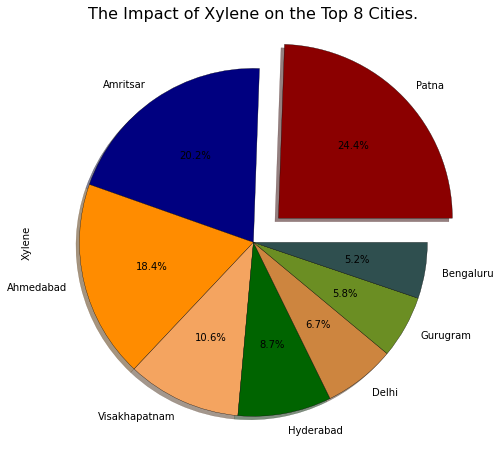

In [59]:
# Plotting Pie Plots for City Air
ex = 0.2,0,0,0,0,0,0,0
cols = 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'Benzene', 'Toluene', 'Xylene'
color = 'darkred', 'navy', 'darkorange', 'sandybrown', 'darkgreen', 'peru', 'olivedrab', 'darkslategray'
for col in cols:
    plt.figure(figsize=(12,8))
    x= df1.groupby('City')[col].sum().sort_values(ascending=False)
    x.reset_index('City')
    x[ :8].plot.pie(shadow=True, autopct='%1.1f%%', colors=color, explode=ex, wedgeprops={'edgecolor':'black', 'linewidth':0.3})
    plt.title(f"The Impact of {col} on the Top 8 Cities.", fontsize=16)

* **After analyzing the above Pie charts, we observe that 'Ahmedabad', 'Delhi', 'Bengaluru', 'Mumbai', 'Hyderabad' and 'Chennai' are the most polluted cities of India.**
* **Ahmadabad city Air contains 82% of the total Carbon Monoxides(CO) of the Country. Carbon Monooxides is a highly poisenues gas.**
* **Mumbai City Air contains 44% of the total Sulpher dioxide(SO2) of the Country.**

## Cities with Good Air Quality.

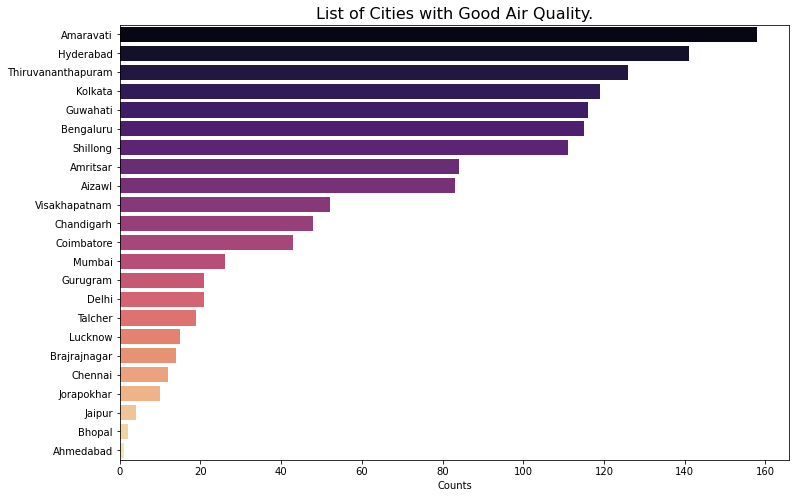

In [60]:
# Cities with Good Air
x= pd.DataFrame(df1['City'][df1['AQI']<=50].value_counts())
x= x.rename(columns={'City':'Counts'})
plt.figure(figsize=(12,8))
sns.barplot(x='Counts', y=x.index, data=x, palette= 'magma')
plt.title("List of Cities with Good Air Quality.", fontsize=16);

* **we observe that Shillong and Amaravati are the Top 2 City with the Good Air Quality. For more than 200 times, these two cities encounter AQI less than 50 while it is hard for other cities to get it for more than 150.**

## Pre Corona [2015 to 2020]

Here I divide the data set into two part namely Vehicular Pollution content (PM2.5, PM10, NO2, NH3, CO,) and Industrial Pollution content (CO, SO2, O3, Benzene, Toluene, Xylene) and find how these contents correlated with AQI (air quality index)

In [61]:
df2 = df1.copy()
df2 = df2[df2['Date']<= '2020-01-01'] 
df2['Vehicular Pollution content'] = df2['PM2.5']+df2['PM10']+df2['NO']+df2['NO2']+df2['NOx']+df2['NH3']+df2['CO']
df2['Industrial Pollution content'] = df2['SO2']+df2['O3']+df2['Benzene']+df2['Toluene']+df2['Xylene']
df2= df2.drop(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3','Benzene','Toluene','Xylene'],axis=1)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24908 entries, 0 to 29348
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   City                          24908 non-null  object        
 1   Date                          24908 non-null  datetime64[ns]
 2   AQI                           24908 non-null  float64       
 3   Air_quality                   24908 non-null  object        
 4   Vehicular Pollution content   24908 non-null  float64       
 5   Industrial Pollution content  24908 non-null  float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 1.3+ MB


In [62]:
def ploting(var):
    df2[var].iplot(title=var,xTitle='Cities',yTitle=var, linecolor='black', )
    plt.show()
ploting('Vehicular Pollution content')
ploting('Industrial Pollution content')


In [63]:
def max_bar_plot(var):
    df2[['City',var]].groupby(["City"]).median().sort_values(by = var,ascending = True).tail(10).iplot(kind='bar', xTitle='Cities',yTitle=var, linecolor='blue', title='{2} {1} {0}'.format(")",var,' Most polluted cities('))

max_bar_plot('Industrial Pollution content')
max_bar_plot('Vehicular Pollution content')

In [64]:
def min_bar_plot(var):
    df2[['City',var]].groupby(["City"]).mean().sort_values(by = var,
    ascending = True).head(10).iplot(kind='bar', yTitle='Cities',xTitle=var, linecolor='blue',title='{2} {1} {0}'.format(")",var,' Minimum polluted cities('))
min_bar_plot('Industrial Pollution content')
min_bar_plot('Vehicular Pollution content')

In [65]:
def al(var):
    cities = [var]
    filtered_city_day = df1[df1['Date'] <= '2020-04-01']
    AQI = filtered_city_day[filtered_city_day.City.isin(cities)][['City','Air_quality']]
    AQI[var] = AQI['Air_quality']
    k = AQI[var].value_counts()
    m = pd.DataFrame((round((k/sum(k))*100)))
    return m
c11 = al('Ahmedabad')
c22 = al('Delhi')
c33 = al('Kolkata')
c44 = al('Mumbai')
c55 = al('Bengaluru')
df_row = pd.concat([c11,c22,c33,c44,c55],axis=1)
df_row.iplot(kind='bar', align='center',xTitle='Satisfaction level', yTitle='percentage of satisfaction' ,linecolor='black', title='Satisfaction level of people(Pre COVID19)')

## Post Corona [2020 >]

In [66]:
df2 = df1.copy()
df2 = df2[df2['Date'] > ('2020-01-01')] 
df2['Vehicular Pollution content'] = df2['PM2.5']+df2['PM10']+df2['NO']+df2['NO2']+df2['NOx']+df2['NH3']+df2['CO']
df2['Industrial Pollution content'] = df2['SO2']+df2['O3']+df2['Benzene']+df2['Toluene']+df2['Xylene']
df2= df2.drop(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3','Benzene','Toluene','Xylene'],axis=1)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4623 entries, 1827 to 29530
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   City                          4623 non-null   object        
 1   Date                          4623 non-null   datetime64[ns]
 2   AQI                           4623 non-null   float64       
 3   Air_quality                   4623 non-null   object        
 4   Vehicular Pollution content   4623 non-null   float64       
 5   Industrial Pollution content  4623 non-null   float64       
dtypes: datetime64[ns](1), float64(3), object(2)
memory usage: 252.8+ KB


In [67]:
def ploting(var):
    df2[var].iplot(title=var,xTitle='Cities',yTitle=var, linecolor='black', )
    plt.show()
ploting('Vehicular Pollution content')
ploting('Industrial Pollution content')

In [68]:
def max_bar_plot(var):
    df2[['City',var]].groupby(["City"]).median().sort_values(by = var,
    ascending = True).tail(10).iplot(kind='bar', xTitle='Cities',yTitle=var, 
                                     linecolor='black', title='{2} {1} {0}'.format(")",var,' Most polluted cities('))

max_bar_plot('Industrial Pollution content')
max_bar_plot('Vehicular Pollution content')

In [69]:
def min_bar_plot(var):
    df2[['City',var]].groupby(["City"]).mean().sort_values(by = var,
    ascending = True).head(10).iplot(kind='bar', yTitle='Cities',xTitle=var, linecolor='black',title='{2} {1} {0}'.format(")",var,' Minimum polluted cities('))
min_bar_plot('Industrial Pollution content')
min_bar_plot('Vehicular Pollution content')


## Most polluted Cities

In [70]:
x1= df2[['Vehicular Pollution content','City']].groupby(["City"]).median().sort_values(by='Vehicular Pollution content',ascending=False).reset_index()

from plotly.subplots import make_subplots
fig = make_subplots(
    rows=1, cols=1,
    subplot_titles=())

fig.add_trace(go.Bar( y=x1['Vehicular Pollution content'], x=x1["City"],  
                     marker=dict(color=x1['Vehicular Pollution content'], coloraxis="coloraxis")),
              1, 1)
fig.update_layout(coloraxis=dict(colorscale='reds'), showlegend=False,plot_bgcolor='white')
fig.update_xaxes(ticks="outside", tickwidth=2,tickangle=45, tickcolor='crimson', ticklen=10,title_text="cities")
fig.update_yaxes(title_text="ug / m3", row=1, col=1)

fig.show()

In [71]:
x2= df2[['Industrial Pollution content','City']].groupby(["City"]).median().sort_values(by='Industrial Pollution content',ascending=False).reset_index()

from plotly.subplots import make_subplots
fig = make_subplots(
    rows=1, cols=1,
    subplot_titles=())

fig.add_trace(go.Bar( y=x2['Industrial Pollution content'], x=x2["City"],  
                     marker=dict(color=x2['Industrial Pollution content'], coloraxis="coloraxis")),
              1, 1)
fig.update_layout(coloraxis=dict(colorscale='reds'), showlegend=False,plot_bgcolor='white')
fig.update_xaxes(ticks="outside", tickwidth=2,tickangle=45, tickcolor='crimson', ticklen=10,title_text="cities")
fig.update_yaxes(title_text="ug / m3", row=1, col=1)

fig.show()

* **Most polluted city is Delhi.It has maximum concentrations of Vehicular Pollution content (PM2.5, PM10, NO2, NH3, CO) and Industrial Pollution content (CO, SO2, O3, Benzene, Toluene, Xylene).**

## Effect of Lockdown on AQI- AQI for some of the major cities of India

In [72]:
cities = ['Ahmedabad','Delhi','Bengaluru','Mumbai','Hyderabad','Chennai']

filtered_df1 = df1[df1['Date'] >= '2019-01-01']
AQI = filtered_df1[filtered_df1.City.isin(cities)][['Date','City','PM2.5','O3']]
AQI.head()

,Date,City,PM2.5,O3
1461,2019-01-01,Ahmedabad,110.71,57.12
1462,2019-01-02,Ahmedabad,147.57,48.23
1463,2019-01-03,Ahmedabad,131.50,43.25
1464,2019-01-04,Ahmedabad,102.12,51.71
1465,2019-01-05,Ahmedabad,115.00,59.25


In [73]:
AQI_pivot = AQI.pivot(index='Date', columns='City', values='PM2.5')
AQI_pivot.fillna(method='bfill',inplace=True)


from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(
    rows=6, cols=1,
    #specs=[[{}, {}],
          # [{"colspan": 6}, None]],
    subplot_titles=("Ahmedabad","Bengaluru","Chennai","Delhi",'Hyderabad','Mumbai'))

fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Ahmedabad'],
                    marker=dict(color=AQI_pivot['Ahmedabad'],coloraxis="coloraxis")),
              1, 1)
fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Bengaluru'],
                    marker=dict(color=AQI_pivot['Bengaluru'], coloraxis="coloraxis")),
              2, 1)
fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Chennai'],
                    marker=dict(color=AQI_pivot['Chennai'], coloraxis="coloraxis")),
              3, 1)
fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Delhi'],
                    marker=dict(color=AQI_pivot['Delhi'], coloraxis="coloraxis")),
              4, 1)
fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Hyderabad'],
                    marker=dict(color=AQI_pivot['Hyderabad'], coloraxis="coloraxis")),
              5, 1)
fig.add_trace(go.Bar(x=AQI_pivot.index, y=AQI_pivot['Mumbai'],
                    marker=dict(color=AQI_pivot['Mumbai'], coloraxis="coloraxis")),
              6, 1)

fig.update_layout(coloraxis=dict(colorscale='Temps'),showlegend=False,title_text="PM2.5 Levels")

fig.update_layout(plot_bgcolor='white')

fig.update_layout( width=800,height=1200,shapes=[
      dict(
      type= 'line',
      yref= 'paper', y0= 0, y1= 1,
      xref= 'x', x0= '2020-03-25', x1= '2020-03-25'
    )
])
fig.show()

 * #### The black vertical line shows the date on which the first phase of lockdown ame into effect in India.
 * #### The above graph shows the variation of various pollutant levels, from Jan 2019 onwards till date.
 * #### Apparantely, all the above Indian cities seem to be a dangerously high level of pollution levels.
 * #### Clearly, there appears to be a rapid decline after 25th March,2020 in all the cities under sonsideration.
